<a href="https://colab.research.google.com/github/mdssumin/SmartFactory_with_MDSTech_2nd/blob/main/Personal_Project/Younggyu_Kim/Yolov5(hyp_compare).ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#기본 세팅

In [ ]:
from glob import glob
import yaml
import matplotlib.pyplot as plt
import cv2
from google.colab.patches import cv2_imshow

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
def show_detection(path):
  image = cv2.imread(path)
  fig = plt.gcf()
  fig.set_size_inches(18,10)
  plt.axis('off')
  # cv2에서는 rgb 반전되어서 다시 돌려주어야 함
  plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))

#Yolov5 불러오기

In [ ]:
#yolov5 clone
%cd /content
!git clone https://github.com/ultralytics/yolov5.git

/content
Cloning into 'yolov5'...
remote: Enumerating objects: 15814, done.
remote: Counting objects: 100% (45/45), done.
remote: Compressing objects: 100% (43/43), done.
remote: Total 15814 (delta 9), reused 22 (delta 2), pack-reused 15769
Receiving objects: 100% (15814/15814), 14.59 MiB | 16.63 MiB/s, done.
Resolving deltas: 100% (10823/10823), done.


In [ ]:
#install yolov5
%cd /content/yolov5/
!pip install -r requirements.txt

/content/yolov5
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 188.5/188.5 kB 15.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 605.5/605.5 kB 46.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.7/62.7 kB 7.0 MB/s eta 0:00:00


#Yolov5 기본 설정으로 이미지에서 객체 검출

In [ ]:
%cd /content/yolov5/
!python detect.py --source /content/drive/MyDrive/drivedataset/wheelchair/wheelchair_ex1.jpg

/content/yolov5
WARNING ⚠️ 'ultralytics.yolo.v8' is deprecated since '8.0.136' and will be removed in '8.1.0'. Please use 'ultralytics.models.yolo' instead.
WARNING ⚠️ 'ultralytics.yolo.utils' is deprecated since '8.0.136' and will be removed in '8.1.0'. Please use 'ultralytics.utils' instead.
Note this warning may be related to loading older models. You can update your model to current structure with:
    import torch
    ckpt = torch.load("model.pt")  # applies to both official and custom models
    torch.save(ckpt, "updated-model.pt")

detect: weights=yolov5s.pt, source=/content/drive/MyDrive/drivedataset/wheelchair/wheelchair_ex1.jpg, data=data/coco128.yaml, imgsz=[640, 640], conf_thres=0.25, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=F

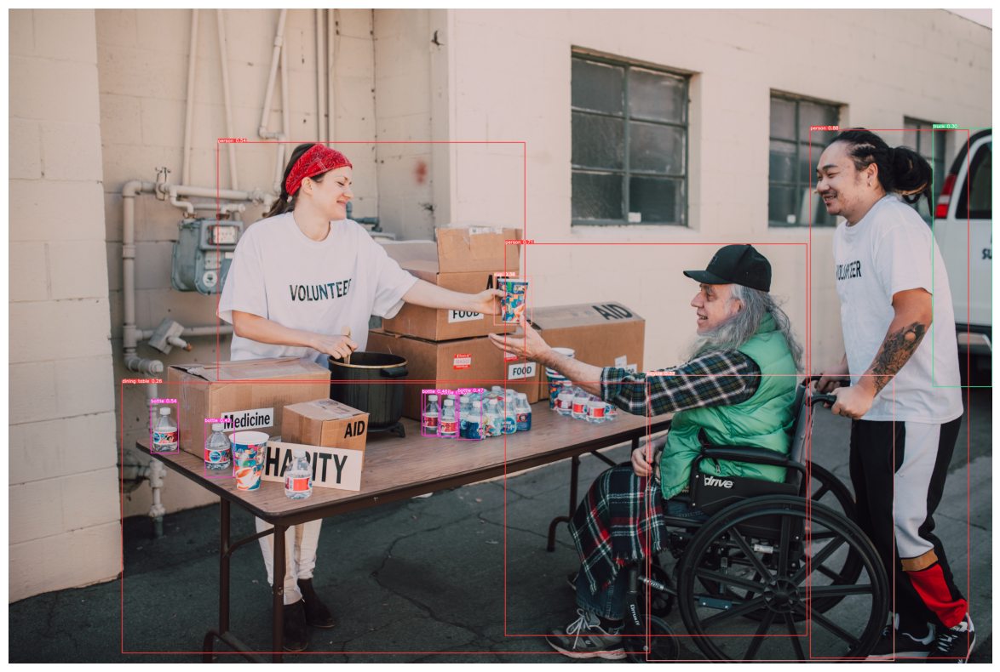

In [ ]:
show_detection('/content/yolov5/runs/detect/exp/wheelchair_ex1.jpg')

In [ ]:
%cd /content/yolov5/
!python detect.py --source /content/drive/MyDrive/drivedataset/wheelchair/wheelchair_ex2.jpg

/content/yolov5
WARNING ⚠️ 'ultralytics.yolo.v8' is deprecated since '8.0.136' and will be removed in '8.1.0'. Please use 'ultralytics.models.yolo' instead.
WARNING ⚠️ 'ultralytics.yolo.utils' is deprecated since '8.0.136' and will be removed in '8.1.0'. Please use 'ultralytics.utils' instead.
Note this warning may be related to loading older models. You can update your model to current structure with:
    import torch
    ckpt = torch.load("model.pt")  # applies to both official and custom models
    torch.save(ckpt, "updated-model.pt")

detect: weights=yolov5s.pt, source=/content/drive/MyDrive/drivedataset/wheelchair/wheelchair_ex2.jpg, data=data/coco128.yaml, imgsz=[640, 640], conf_thres=0.25, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=F

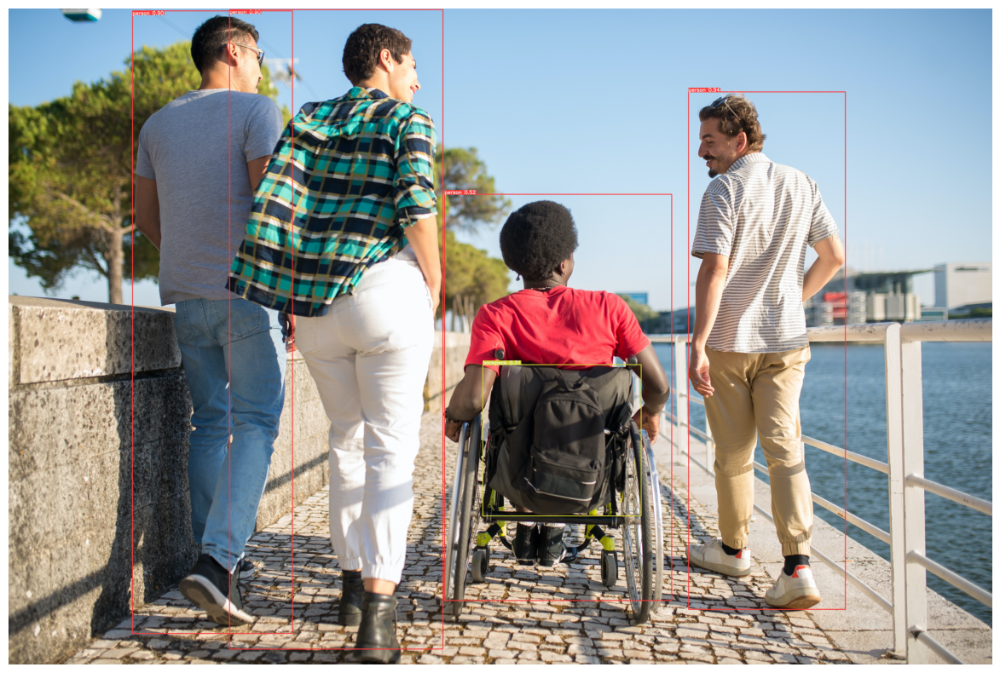

In [ ]:
show_detection('/content/yolov5/runs/detect/exp2/wheelchair_ex2.jpg')

#커스텀 데이터셋 사용

###데이터셋 불러오기

In [ ]:
#roboflow에서 data 불러오기
%cd /content/
!curl -L "https://universe.roboflow.com/ds/3PKTzryPUX?key=KQX2k9moK6" > roboflow.zip; unzip roboflow.zip; rm roboflow.zip

/content
  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
100   901  100   901    0     0    913      0 --:--:-- --:--:-- --:--:--   912
100 17.7M  100 17.7M    0     0  5874k      0  0:00:03  0:00:03 --:--:-- 9541k
Archive:  roboflow.zip
 extracting: README.dataset.txt      
 extracting: README.roboflow.txt     
 extracting: data.yaml               
   creating: test/
   creating: test/images/
 extracting: test/images/105_png_jpg.rf.abc00860d5a8609b78f4df043ece3bac.jpg  
 extracting: test/images/10_png_jpg.rf.9718a5702aaee6b430f116948890d6ec.jpg  
 extracting: test/images/11_png_jpg.rf.d2fa7f47b5b7e71c0043314cecf24ced.jpg  
 extracting: test/images/12_png_jpg.rf.1ce13b127b9e931d48c0adf41262a339.jpg  
 extracting: test/images/18_png_jpg.rf.8f2b10fec8bb68efc2e1bff6d795b4d6.jpg  
 extracting: test/images/20_png_jpg.rf.ba9a936441111993cc6721b5f9baf2fe.jpg  
 extracting: test/images

In [ ]:
#yaml 파일 확인하고 경로 맞춰주기
%cat /content/data.yaml

train: ../train/images
val: ../valid/images

nc: 3
names: ['not wheel chair', 'person', 'wheel chair']

In [ ]:
%cd /

train_img_list = glob('/content/train/images/*.jpg')
val_img_list = glob('/content/valid/images/*.jpg')

print(len(train_img_list))
print(len(val_img_list))

/
694
87


In [ ]:
with open('/content/train.txt', 'w') as t:
  t.write('\n'.join(train_img_list) + '\n')

with open('/content/val.txt', 'w') as v:
  v.write('\n'.join(val_img_list) + '\n')

In [ ]:
with open('/content/data.yaml', 'r') as f:
  data = yaml.full_load(f)
print(data)

data['train'] = '/content/train.txt'
data['val'] = '/content/val.txt'

with  open('/content/data.yaml', 'w') as f:
  yaml.dump(data, f)
print(data)

{'train': '../train/images', 'val': '../valid/images', 'nc': 3, 'names': ['not wheel chair', 'person', 'wheel chair']}
{'train': '/content/train.txt', 'val': '/content/val.txt', 'nc': 3, 'names': ['not wheel chair', 'person', 'wheel chair']}


In [ ]:
%cat /content/data.yaml

names:
- not wheel chair
- person
- wheel chair
nc: 3
train: /content/train.txt
val: /content/val.txt


###커스텀 데이터셋으로 Yolov5 학습

#####SGD


In [ ]:
#yolov5 default epochs100, batch_size16, imgsz640
%cd /content/yolov5/
!python train.py --data /content/data.yaml --cfg ./models/yolov5s.yaml --weights yolov5s.pt --name wheelchair_default

/content/yolov5
WARNING ⚠️ 'ultralytics.yolo.v8' is deprecated since '8.0.136' and will be removed in '8.1.0'. Please use 'ultralytics.models.yolo' instead.
WARNING ⚠️ 'ultralytics.yolo.utils' is deprecated since '8.0.136' and will be removed in '8.1.0'. Please use 'ultralytics.utils' instead.
Note this warning may be related to loading older models. You can update your model to current structure with:
    import torch
    ckpt = torch.load("model.pt")  # applies to both official and custom models
    torch.save(ckpt, "updated-model.pt")

train: weights=yolov5s.pt, cfg=./models/yolov5s.yaml, data=/content/data.yaml, hyp=data/hyps/hyp.scratch-low.yaml, epochs=100, batch_size=16, imgsz=640, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, bucket=, cache=None, image_weights=False, device=, multi_scale=False, single_cls=False, optimizer=SGD, sync_bn=False, workers=8, project=runs/train, name=wheelchair_default, exist_ok=False, quad=False,

In [ ]:
#yolov5 epochs 5
%cd /content/yolov5/
!python train.py --epochs 5 --data /content/data.yaml --cfg ./models/yolov5s.yaml --weights yolov5s.pt --name wheelchair_epoch5

/content/yolov5
WARNING ⚠️ 'ultralytics.yolo.v8' is deprecated since '8.0.136' and will be removed in '8.1.0'. Please use 'ultralytics.models.yolo' instead.
WARNING ⚠️ 'ultralytics.yolo.utils' is deprecated since '8.0.136' and will be removed in '8.1.0'. Please use 'ultralytics.utils' instead.
Note this warning may be related to loading older models. You can update your model to current structure with:
    import torch
    ckpt = torch.load("model.pt")  # applies to both official and custom models
    torch.save(ckpt, "updated-model.pt")

train: weights=yolov5s.pt, cfg=./models/yolov5s.yaml, data=/content/data.yaml, hyp=data/hyps/hyp.scratch-low.yaml, epochs=5, batch_size=16, imgsz=640, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, bucket=, cache=None, image_weights=False, device=, multi_scale=False, single_cls=False, optimizer=SGD, sync_bn=False, workers=8, project=runs/train, name=wheelchair_epoch5, exist_ok=False, quad=False, co

In [ ]:
#yolov5 epochs 15
%cd /content/yolov5/
!python train.py --epochs 15 --data /content/data.yaml --cfg ./models/yolov5s.yaml --weights yolov5s.pt --name wheelchair_epoch15

/content/yolov5
WARNING ⚠️ 'ultralytics.yolo.v8' is deprecated since '8.0.136' and will be removed in '8.1.0'. Please use 'ultralytics.models.yolo' instead.
WARNING ⚠️ 'ultralytics.yolo.utils' is deprecated since '8.0.136' and will be removed in '8.1.0'. Please use 'ultralytics.utils' instead.
Note this warning may be related to loading older models. You can update your model to current structure with:
    import torch
    ckpt = torch.load("model.pt")  # applies to both official and custom models
    torch.save(ckpt, "updated-model.pt")

train: weights=yolov5s.pt, cfg=./models/yolov5s.yaml, data=/content/data.yaml, hyp=data/hyps/hyp.scratch-low.yaml, epochs=15, batch_size=16, imgsz=640, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, bucket=, cache=None, image_weights=False, device=, multi_scale=False, single_cls=False, optimizer=SGD, sync_bn=False, workers=8, project=runs/train, name=wheelchair_epoch15, exist_ok=False, quad=False, 

In [ ]:
#yolov5 batch 64
%cd /content/yolov5/
!python train.py --batch 64 --data /content/data.yaml --cfg ./models/yolov5s.yaml --weights yolov5s.pt --name wheelchair_batch64

/content/yolov5
WARNING ⚠️ 'ultralytics.yolo.v8' is deprecated since '8.0.136' and will be removed in '8.1.0'. Please use 'ultralytics.models.yolo' instead.
WARNING ⚠️ 'ultralytics.yolo.utils' is deprecated since '8.0.136' and will be removed in '8.1.0'. Please use 'ultralytics.utils' instead.
Note this warning may be related to loading older models. You can update your model to current structure with:
    import torch
    ckpt = torch.load("model.pt")  # applies to both official and custom models
    torch.save(ckpt, "updated-model.pt")

train: weights=yolov5s.pt, cfg=./models/yolov5s.yaml, data=/content/data.yaml, hyp=data/hyps/hyp.scratch-low.yaml, epochs=100, batch_size=64, imgsz=640, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, bucket=, cache=None, image_weights=False, device=, multi_scale=False, single_cls=False, optimizer=SGD, sync_bn=False, workers=8, project=runs/train, name=wheelchair_batch64, exist_ok=False, quad=False,

In [ ]:
#yolov5 batch 128
%cd /content/yolov5/
!python train.py --batch 128 --data /content/data.yaml --cfg ./models/yolov5s.yaml --weights yolov5s.pt --name wheelchair_batch128

/content/yolov5
WARNING ⚠️ 'ultralytics.yolo.v8' is deprecated since '8.0.136' and will be removed in '8.1.0'. Please use 'ultralytics.models.yolo' instead.
WARNING ⚠️ 'ultralytics.yolo.utils' is deprecated since '8.0.136' and will be removed in '8.1.0'. Please use 'ultralytics.utils' instead.
Note this warning may be related to loading older models. You can update your model to current structure with:
    import torch
    ckpt = torch.load("model.pt")  # applies to both official and custom models
    torch.save(ckpt, "updated-model.pt")

train: weights=yolov5s.pt, cfg=./models/yolov5s.yaml, data=/content/data.yaml, hyp=data/hyps/hyp.scratch-low.yaml, epochs=100, batch_size=128, imgsz=640, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, bucket=, cache=None, image_weights=False, device=, multi_scale=False, single_cls=False, optimizer=SGD, sync_bn=False, workers=8, project=runs/train, name=wheelchair_batch128, exist_ok=False, quad=Fals

In [ ]:
#yolov5 img 224
%cd /content/yolov5/
!python train.py --img 224 --data /content/data.yaml --cfg ./models/yolov5s.yaml --weights yolov5s.pt --name wheelchair_img224

/content/yolov5
WARNING ⚠️ 'ultralytics.yolo.v8' is deprecated since '8.0.136' and will be removed in '8.1.0'. Please use 'ultralytics.models.yolo' instead.
WARNING ⚠️ 'ultralytics.yolo.utils' is deprecated since '8.0.136' and will be removed in '8.1.0'. Please use 'ultralytics.utils' instead.
Note this warning may be related to loading older models. You can update your model to current structure with:
    import torch
    ckpt = torch.load("model.pt")  # applies to both official and custom models
    torch.save(ckpt, "updated-model.pt")

train: weights=yolov5s.pt, cfg=./models/yolov5s.yaml, data=/content/data.yaml, hyp=data/hyps/hyp.scratch-low.yaml, epochs=100, batch_size=16, imgsz=224, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, bucket=, cache=None, image_weights=False, device=, multi_scale=False, single_cls=False, optimizer=SGD, sync_bn=False, workers=8, project=runs/train, name=wheelchair_img224, exist_ok=False, quad=False, 

In [ ]:
#yolov5 img 416
%cd /content/yolov5/
!python train.py --img 416 --data /content/data.yaml --cfg ./models/yolov5s.yaml --weights yolov5s.pt --name wheelchair_img416

/content/yolov5
WARNING ⚠️ 'ultralytics.yolo.v8' is deprecated since '8.0.136' and will be removed in '8.1.0'. Please use 'ultralytics.models.yolo' instead.
WARNING ⚠️ 'ultralytics.yolo.utils' is deprecated since '8.0.136' and will be removed in '8.1.0'. Please use 'ultralytics.utils' instead.
Note this warning may be related to loading older models. You can update your model to current structure with:
    import torch
    ckpt = torch.load("model.pt")  # applies to both official and custom models
    torch.save(ckpt, "updated-model.pt")

train: weights=yolov5s.pt, cfg=./models/yolov5s.yaml, data=/content/data.yaml, hyp=data/hyps/hyp.scratch-low.yaml, epochs=100, batch_size=16, imgsz=416, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, bucket=, cache=None, image_weights=False, device=, multi_scale=False, single_cls=False, optimizer=SGD, sync_bn=False, workers=8, project=runs/train, name=wheelchair_img416, exist_ok=False, quad=False, 

In [ ]:
#yolov5 img 1280
%cd /content/yolov5/
!python train.py --img 1280 --data /content/data.yaml --cfg ./models/yolov5s.yaml --weights yolov5s.pt --name wheelchair_img1280

/content/yolov5
WARNING ⚠️ 'ultralytics.yolo.v8' is deprecated since '8.0.136' and will be removed in '8.1.0'. Please use 'ultralytics.models.yolo' instead.
WARNING ⚠️ 'ultralytics.yolo.utils' is deprecated since '8.0.136' and will be removed in '8.1.0'. Please use 'ultralytics.utils' instead.
Note this warning may be related to loading older models. You can update your model to current structure with:
    import torch
    ckpt = torch.load("model.pt")  # applies to both official and custom models
    torch.save(ckpt, "updated-model.pt")

train: weights=yolov5s.pt, cfg=./models/yolov5s.yaml, data=/content/data.yaml, hyp=data/hyps/hyp.scratch-low.yaml, epochs=100, batch_size=16, imgsz=1280, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, bucket=, cache=None, image_weights=False, device=, multi_scale=False, single_cls=False, optimizer=SGD, sync_bn=False, workers=8, project=runs/train, name=wheelchair_img1280, exist_ok=False, quad=False

In [ ]:
# %load_ext tensorboard
# %reload_ext tensorboard
# %tensorboard --logdir /content/yolov5/runs/

#####Adam

In [ ]:
#yolov5 adam
%cd /content/yolov5/
!python train.py --optimizer 'Adam' --data /content/data.yaml --cfg ./models/yolov5s.yaml --weights yolov5s.pt --name wheelchair_adam

/content/yolov5
WARNING ⚠️ 'ultralytics.yolo.v8' is deprecated since '8.0.136' and will be removed in '8.1.0'. Please use 'ultralytics.models.yolo' instead.
WARNING ⚠️ 'ultralytics.yolo.utils' is deprecated since '8.0.136' and will be removed in '8.1.0'. Please use 'ultralytics.utils' instead.
Note this warning may be related to loading older models. You can update your model to current structure with:
    import torch
    ckpt = torch.load("model.pt")  # applies to both official and custom models
    torch.save(ckpt, "updated-model.pt")

train: weights=yolov5s.pt, cfg=./models/yolov5s.yaml, data=/content/data.yaml, hyp=data/hyps/hyp.scratch-low.yaml, epochs=100, batch_size=16, imgsz=640, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, bucket=, cache=None, image_weights=False, device=, multi_scale=False, single_cls=False, optimizer=Adam, sync_bn=False, workers=8, project=runs/train, name=wheelchair_adam, exist_ok=False, quad=False, c

In [ ]:
#yolov5 adam batch 64
%cd /content/yolov5/
!python train.py --optimizer 'Adam' --batch 64 --data /content/data.yaml --cfg ./models/yolov5s.yaml --weights yolov5s.pt --name wheelchair_adam_batch64

/content/yolov5
WARNING ⚠️ 'ultralytics.yolo.v8' is deprecated since '8.0.136' and will be removed in '8.1.0'. Please use 'ultralytics.models.yolo' instead.
WARNING ⚠️ 'ultralytics.yolo.utils' is deprecated since '8.0.136' and will be removed in '8.1.0'. Please use 'ultralytics.utils' instead.
Note this warning may be related to loading older models. You can update your model to current structure with:
    import torch
    ckpt = torch.load("model.pt")  # applies to both official and custom models
    torch.save(ckpt, "updated-model.pt")

train: weights=yolov5s.pt, cfg=./models/yolov5s.yaml, data=/content/data.yaml, hyp=data/hyps/hyp.scratch-low.yaml, epochs=100, batch_size=64, imgsz=640, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, bucket=, cache=None, image_weights=False, device=, multi_scale=False, single_cls=False, optimizer=Adam, sync_bn=False, workers=8, project=runs/train, name=wheelchair_adam_batch64, exist_ok=False, quad=

In [ ]:
#yolov5 adam batch 128
%cd /content/yolov5/
!python train.py --optimizer 'Adam' --batch 128 --data /content/data.yaml --cfg ./models/yolov5s.yaml --weights yolov5s.pt --name wheelchair_adam_batch128

/content/yolov5
WARNING ⚠️ 'ultralytics.yolo.v8' is deprecated since '8.0.136' and will be removed in '8.1.0'. Please use 'ultralytics.models.yolo' instead.
WARNING ⚠️ 'ultralytics.yolo.utils' is deprecated since '8.0.136' and will be removed in '8.1.0'. Please use 'ultralytics.utils' instead.
Note this warning may be related to loading older models. You can update your model to current structure with:
    import torch
    ckpt = torch.load("model.pt")  # applies to both official and custom models
    torch.save(ckpt, "updated-model.pt")

train: weights=yolov5s.pt, cfg=./models/yolov5s.yaml, data=/content/data.yaml, hyp=data/hyps/hyp.scratch-low.yaml, epochs=100, batch_size=128, imgsz=640, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, bucket=, cache=None, image_weights=False, device=, multi_scale=False, single_cls=False, optimizer=Adam, sync_bn=False, workers=8, project=runs/train, name=wheelchair_adam_batch128, exist_ok=False, qua

#비교

1. adam vs sgd  
  일반적으로 deep learning에서 adam이 sgd보다 뛰어난 성능을 보이지만 transfer learning에서는 sgd의 느리다는 단점이 보완되면서 더 안정적인 sgd가 adam보다 뛰어난 성능을 보인다는 것을 확인할 수 있었다. mAP_0.5, mAP_0.5:0.95에서 모두 sgd가 훨씬 뛰어난 성능을 보이며 train/val_loss또한 더 빠른 속도로 수렴한다.  

2. sgd  
2-1. epoch 5 vs 15 vs 100(default)  
transfer learning에서는 적은 epoch에서도 괜찮은 성능을 보인다는 말이 있어 epoch를 적게 하여 돌려보았다. 5회, 15회, 100회를 비교하였을때, 5epoch는 나머지 둘과 비교하였을때 현저히 성능이 뒤떨어지며, 이 데이터셋에서 학습이 충분하지 않아 보인다. 15epoch는 mAP_0.5에서 0.96으로 성능이 괜찮아 보이지만 mAP_0.5:0.95에서는 0.64로 0.83인 100epoch보다는 확실히 부족한 성능을 보인다.  
2-2. epoch 100  
epoch를 100까지 진행했음에도 val_loss에서 overfitting이 일어나지 않고 아래로 수렴하는 모습을 보인다. 만약 여유가 있다면 epoch를 더 늘리는 편이 더 좋은 성능을 보일 것이다.   
2-3. sgd lr 설정에서의 batch 16(default) vs 64 vs 128  
yolov5에서 sgd의 learning rate는 초기에 비교적 높은 0.01로 시작하여 점점 작아지는 구조를 가지고 있다. 이런 구조에서 batch size가 커짐에 따라 높은 learning rate와 맞물려 한번에 많은 학습을 하려고 하기 때문에 초반에 loss가 작은 batch에 비해 느리게 수렴한다. 다만 epoch를 늘려갈수록 점점 안정되어 모든 batch size에서 비슷한 성능을 보인다.  
2-4. img 224 vs 416 vs 640(default) vs 1280  
가장 크기가 큰 1280에서 가장 뒤떨어지는 성능을 보인다. 본래 이미지 사이즈인 416과 이에 가까운 default setting인 640이 mAP_0.5와 mAP_0.5:0.95에서 비슷하게 좋은 성능을 보인다.  


In [ ]:
%load_ext tensorboard
%reload_ext tensorboard
%tensorboard --logdir /content/yolov5/runs/

<IPython.core.display.Javascript object>